# Importing Libraries

In [55]:
import lightkurve as lk  # LightKurve Python Package to View & Process the Transit Light Curves
import numpy as np       # Numpy for Scientific Computing
import matplotlib.pyplot as plt # Matplotlib for Plotting the Garphs

import os

# Path to the files needed to Combine & Detrend

In [56]:
# Define the TOI ID of a Target
TOI_ID = '181' # Only number i.e., if the target is TOI 111 then only write 111

#path to provide sector download codes
indir="C:/Personal/Internships/ExoplanetStatisticalValidationVATEST_package/"

search_result = lk.search_lightcurve('TOI 181', author='SPOC',exptime='short')
lc_collection=search_result.download_all()

# Combining the Sectors & Plot it

(<AxesSubplot:xlabel='Time - 2457000 [BTJD days]', ylabel='Normalized Flux'>,
 <AxesSubplot:xlabel='Time - 2457000 [BTJD days]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>)

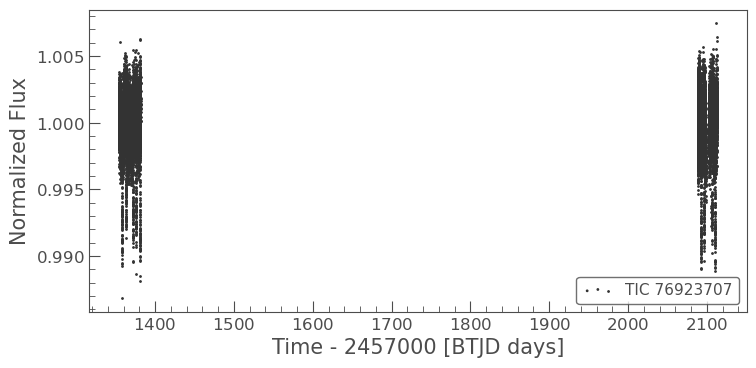

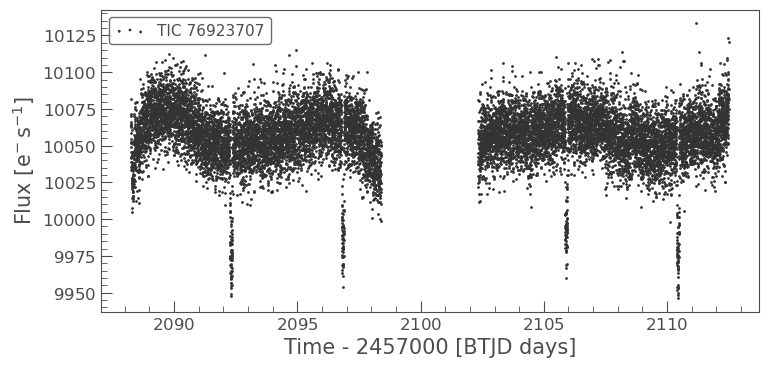

In [57]:
# Combine all available Light Curves
# Add or remove file_n based on the total number of files below
Combined_TOI = lc_collection.stitch()
Combined_TOI.scatter(),lc_collection[1].scatter()

# Periodogram

`period` contains 1092753 points.Periodogram is likely to be large, and slow to evaluate. Consider setting `frequency_factor` to a higher value.
 Orbital Period (d) :  4.560000000000003 d 
 Epoch Time (BTJD) :  1358.0682857030586 
 Transit Duration (d) :  0.2 d


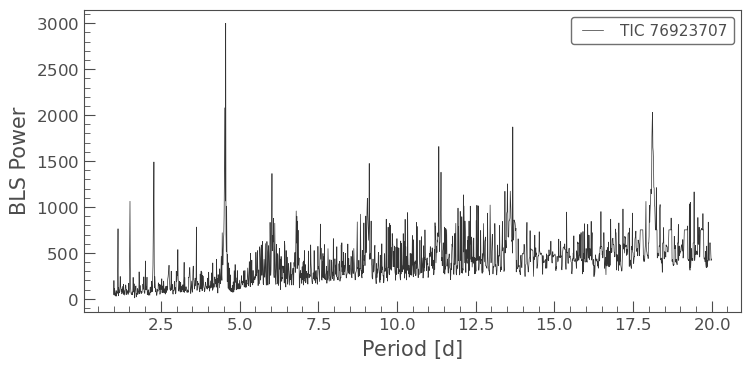

In [58]:
# Create a Periodogram to find out the period of repeated occurrence
# In general find out the period of transit, Epoch time and Transit Durataion

pg = Combined_TOI.to_periodogram(method = 'bls', period = np.arange(1,20,0.01))
pg.plot()

time_period = pg.period_at_max_power
total_transit_time = pg.transit_time_at_max_power
transit_duration = pg.duration_at_max_power

print(" Orbital Period (d) : ", time_period, "\n Epoch Time (BTJD) : ", total_transit_time,\
      "\n Transit Duration (d) : ", transit_duration)

# Masking and Detrending

`period` contains 1092779 points.Periodogram is likely to be large, and slow to evaluate. Consider setting `frequency_factor` to a higher value.


 Orbital Period (d) :  4.531999999999611 d 
 Epoch Time (BTJD) :  1358.1232857030586 
 Transit Duration (d) :  0.1 d


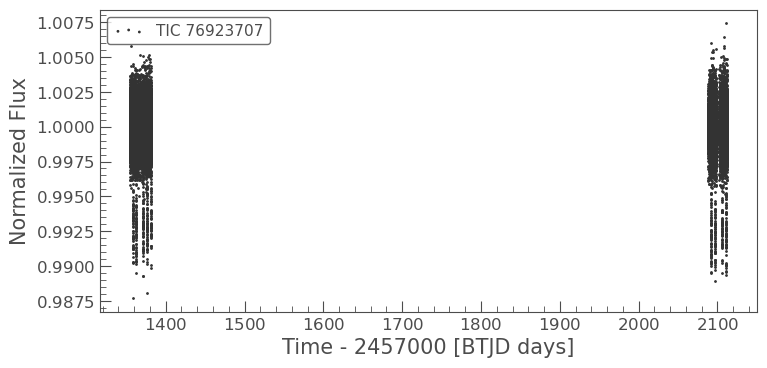

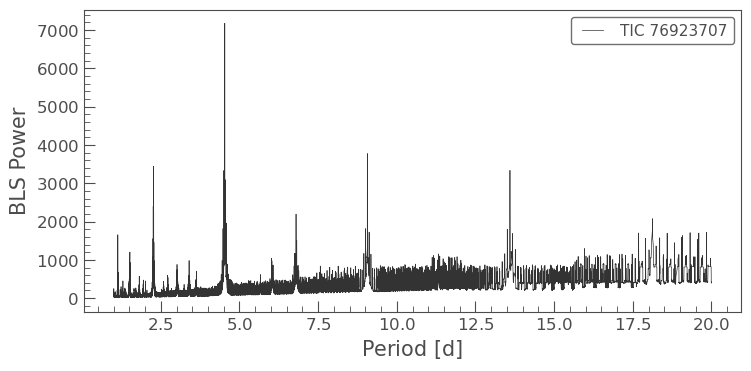

In [59]:
# Based on previous evaluated values we have to mask all the transits and need to de-trend the remaining portion
# In a view to avoide the stellar activity 

# Mask the transits 
# Paste below the data (period, epoch time, transit duration) calculated above.
masked_lc = Combined_TOI.create_transit_mask(period = 4.560000000000003, 
                                             transit_time = 1358.0682857030586 , 
                                             duration = 0.25)

# Detrending the out of transit part
flat_lc = Combined_TOI.flatten(mask = masked_lc)
flat_lc.scatter()

# Create the Periodogram of Detrended Light Curve
pg_flatten = flat_lc.to_periodogram(method = 'bls', period = np.arange(1,20,0.001))
pg_flatten.plot()

# Print the evaluated values
time_period = pg_flatten.period_at_max_power
transit_time = pg_flatten.transit_time_at_max_power
transit_duration = pg_flatten.duration_at_max_power
print("\n")
print(" Orbital Period (d) : ",time_period,"\n","Epoch Time (BTJD) : ",transit_time,\
      "\n","Transit Duration (d) : ", transit_duration)

`period` contains 1092779 points.Periodogram is likely to be large, and slow to evaluate. Consider setting `frequency_factor` to a higher value.


 Orbital Period (d) :  4.531999999999611 d 
 Epoch Time (BTJD) :  1358.1232857030586 
 Transit Duration (d) :  0.1 d


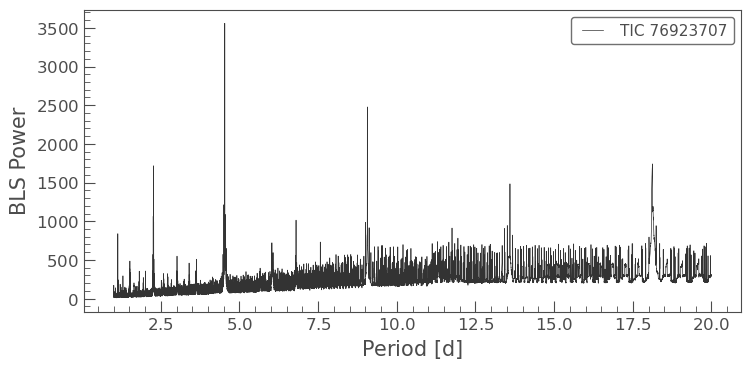

In [60]:
# Based on previous evaluated values we have to mask all the transits and need to de-trend the remaining portion
# In a view to avoide the stellar activity 

# Mask the transits 
# Paste below the data (period, epoch time, transit duration) calculated above.
masked_lc = Combined_TOI.create_transit_mask(period = time_period, 
                                             transit_time = total_transit_time , 
                                             duration = transit_duration.value+0.05)

# Detrending the out of transit part
flat_lc = Combined_TOI.flatten(mask = masked_lc)

# Create the Periodogram of Detrended Light Curve
pg_flatten = flat_lc.to_periodogram(method = 'bls', period = np.arange(1,20,0.001))
pg_flatten.plot()

# Print the evaluated values
time_period = pg_flatten.period_at_max_power
transit_time = pg_flatten.transit_time_at_max_power
transit_duration = pg_flatten.duration_at_max_power
print("\n")
print(" Orbital Period (d) : ",time_period,"\n","Epoch Time (BTJD) : ",transit_time,\
      "\n","Transit Duration (d) : ", transit_duration)

# Plot the Folded Light Curve

(-0.5, 0.5)

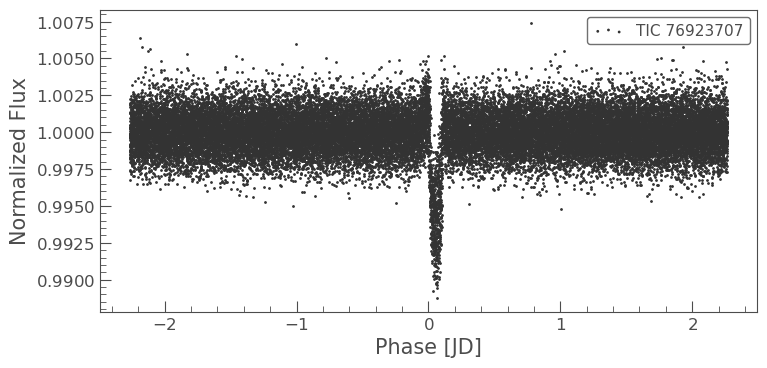

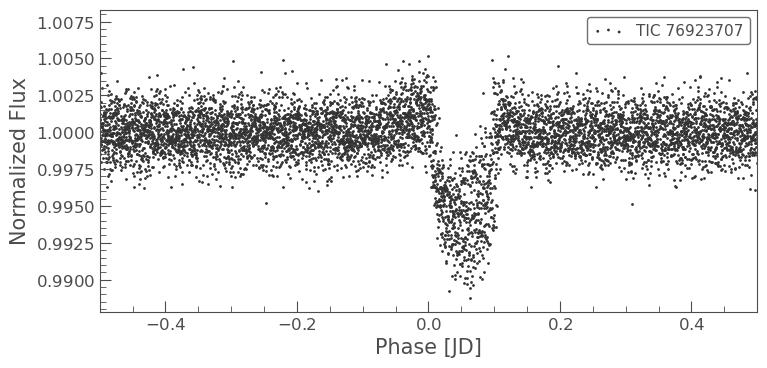

In [61]:
# Fold the light curve based on calculated Time Period & Epoch Time
folded_lc = flat_lc.fold(period = time_period, epoch_time = total_transit_time)

# Plot whole folded light curve
folded_lc.scatter()

# Focused on transit
folded_lc.scatter()
plt.xlim(-0.5,0.5)

# Saving the .fits File for further analysis

In [66]:
# Add columns pdcsap & pdcsap_err to the .fits file
# These two columns will be used while modeling as a raw data
pdcsap = flat_lc.flux
pdcsap_err = flat_lc.flux_err

# Save the File
flat_lc.to_fits(path = 'Detrended & Combined Lightcurves/Combined TOI '+TOI_ID+'.fits',overwrite = True, pdcsap_flux = pdcsap, pdcsap_flux_err = pdcsap_err)

'''
# Open the file and print
Final_Light_Curve = lk.read('Detrended & Combined Lightcurves/Combined TOI '+TOI_ID+'.fits')
Final_Light_Curve
'''

PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'Detrended & Combined Lightcurves/Combined TOI 181.fits'

In [65]:
# Open the file and print
Final_Light_Curve = lk.read('Detrended & Combined Lightcurves/Combined TOI '+TOI_ID+'.fits')
Final_Light_Curve

LightkurveError: Error in reading Data product Detrended & Combined Lightcurves/Combined TOI 181.fits of type TessLightCurve .
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.